In [1]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt

In [2]:
def preprocess_image(image):
    # 1. Resize the image
    resized_image = cv2.resize(image, (224, 224))
    
    # 2. Apply Gaussian Blur - Using a smaller kernel
    blurred_image = cv2.GaussianBlur(resized_image, (3, 3), 0)
    
    # 3. Sharpen the image - Using a less aggressive kernel
    kernel = np.array([[0, -1, 0], 
                       [-1, 5, -1],
                       [0, -1, 0]])
    sharpened_image = cv2.filter2D(blurred_image, -1, kernel)
    
    # Apply CLAHE to the LAB color space - Fine-tune CLAHE parameters
    img_lab = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(img_lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))  # Reduced clip limit
    l2 = clahe.apply(l)
    img_lab_clahe = cv2.merge((l2, a, b))
    clahe_image = cv2.cvtColor(img_lab_clahe, cv2.COLOR_LAB2BGR)
    
    
    return clahe_image

In [3]:
def visualize_preprocessing(image_path):
    image = cv2.imread(image_path)
    preprocessed_image = preprocess_image(image)
    
    # Visualize the images
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original Image')

    axs[1].imshow(cv2.cvtColor(preprocessed_image, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Preprocessed Image')

    plt.show()

In [4]:
def preprocess_and_save_image(image_path, output_path):
    image = cv2.imread(image_path)
    preprocessed_image = preprocess_image(image)
    cv2.imwrite(output_path, preprocessed_image)

In [5]:
def preprocess_dataset(dataset_dir, output_dir):
    categories = ['REAL', 'FAKE']
    splits = ['train', 'test']
    
    for split in splits:
        for category in categories:
            input_dir = os.path.join(dataset_dir, split, category)
            output_subdir = os.path.join(output_dir, split, category)
            os.makedirs(output_subdir, exist_ok=True)
            
            for img_filename in os.listdir(input_dir):
                img_path = os.path.join(input_dir, img_filename)
                output_path = os.path.join(output_subdir, img_filename)
                preprocess_and_save_image(img_path, output_path)
                print(f"Processed and saved: {output_path}")

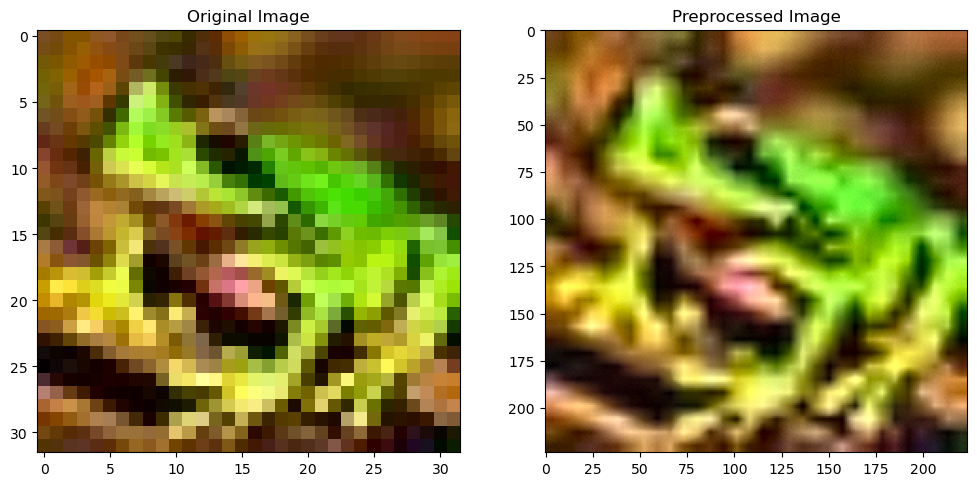

In [7]:
# Visualize preprocessing for an example image
example_image_path = r"D:\AI Labs - Python\Pattern Recognition\CIFAKE\train\FAKE\1004 (7).jpg"  # Update with an actual path
visualize_preprocessing(example_image_path)

In [59]:
# Uncomment to preprocess the entire dataset
dataset_dir = "D:\AI Labs - Python\Pattern Recognition\CIFAKE"  # Update with your CIFAKE dataset path
output_dir = "D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE"  # Update with your desired output path
preprocess_dataset(dataset_dir, output_dir)

Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (10).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (2).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (3).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (4).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (5).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (6).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (7).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (8).jpg
Processed and saved: D:\AI Labs - Python\Pattern Recognition\PreProcessing-CIFAKE\train\REAL\0000 (9).jpg
Processed and saved: D:\AI Labs - Python\Patt